In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime as dt
import pandas as pd
import plotly.express as px
import seaborn as sns
import statsmodels as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import statistics

mpl.rcParams['figure.figsize'] = [10,8]
mpl.rcParams['axes.grid'] = False

In [2]:
#!pip install download

In [3]:
from fbprophet import Prophet

In [4]:
data = pd.read_csv('Desktop/DataChallenge/Cleaned_dataset_P&B.csv', parse_dates=['DATE'], index_col=["DATE"])
#pd.set_option('display.max_rows', None)
data.head()

,NAICS_DESC,anonimized_name,total_revenue
DATE,,,
2020-10-20,Offices of Lawyers,Aaron Walker INC,40
2020-11-12,Offices of Lawyers,Aaron Walker INC,18
2020-11-13,Offices of Lawyers,Aaron Walker INC,18
2020-11-30,Offices of Lawyers,Aaron Walker INC,820
2020-12-01,Offices of Lawyers,Aaron Walker INC,213


In [5]:
# looking for missing data
count_null = pd.DataFrame(data.isnull().sum(), columns = ['Null Values'])
count_null

,Null Values
NAICS_DESC,2592
anonimized_name,0
total_revenue,0


In [6]:
data.dtypes

NAICS_DESC         object
anonimized_name    object
total_revenue       int64
dtype: object

In [7]:
data.fillna('Not Available', inplace = True)

In [8]:
data.isnull().sum()

NAICS_DESC         0
anonimized_name    0
total_revenue      0
dtype: int64

In [9]:
unique_clients = data['anonimized_name'].unique() 

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


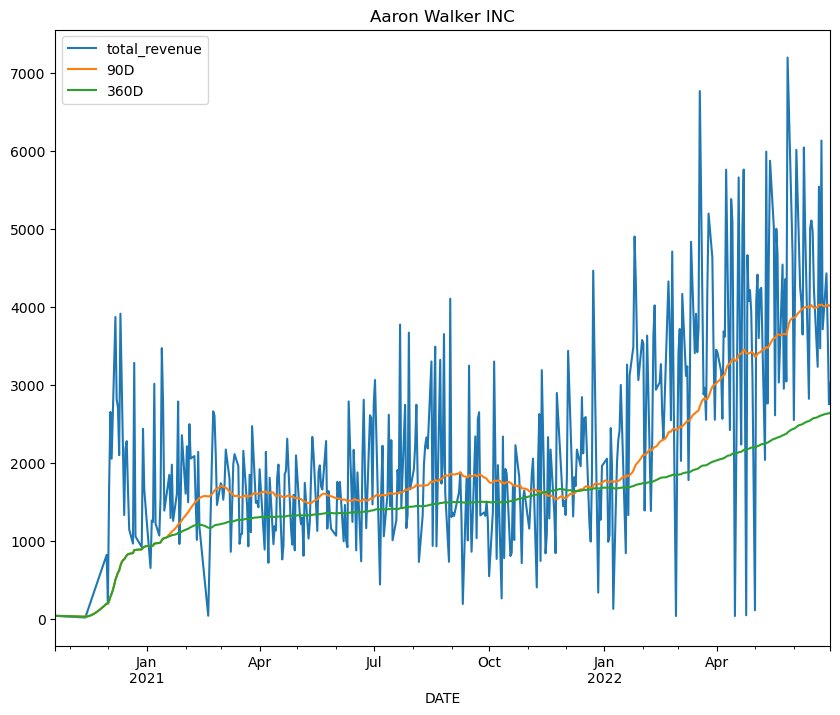

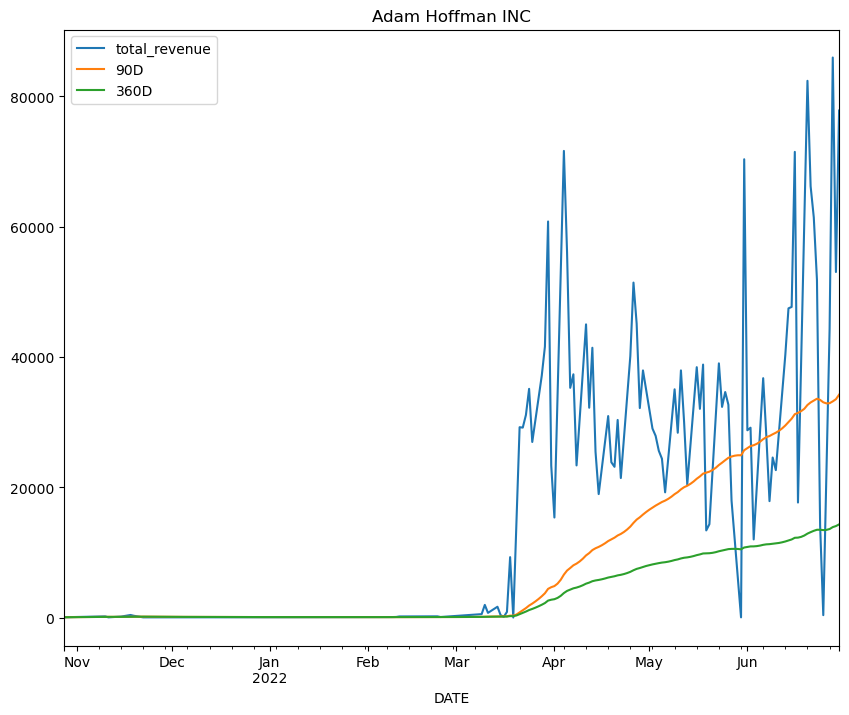

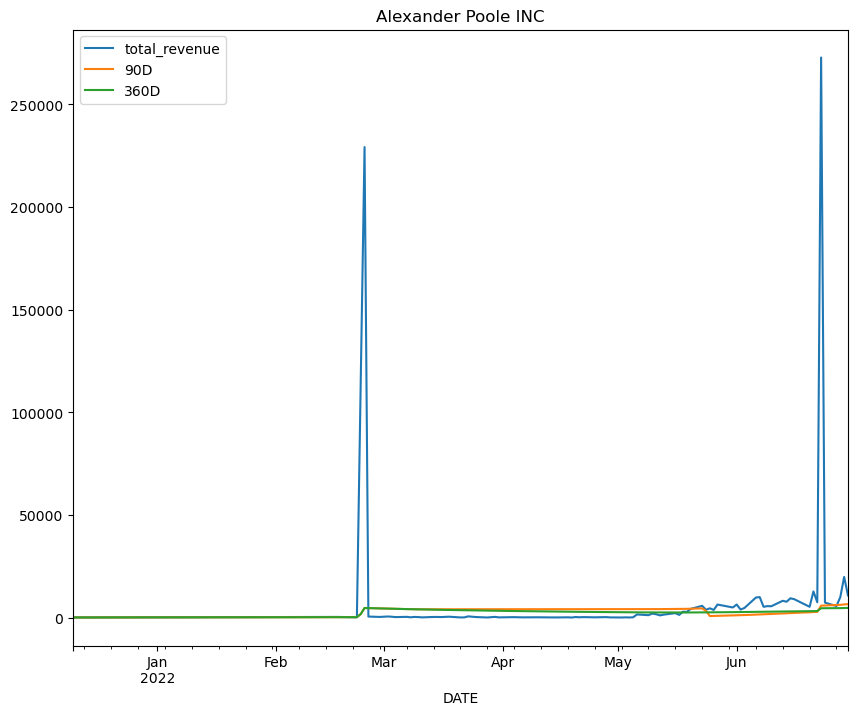

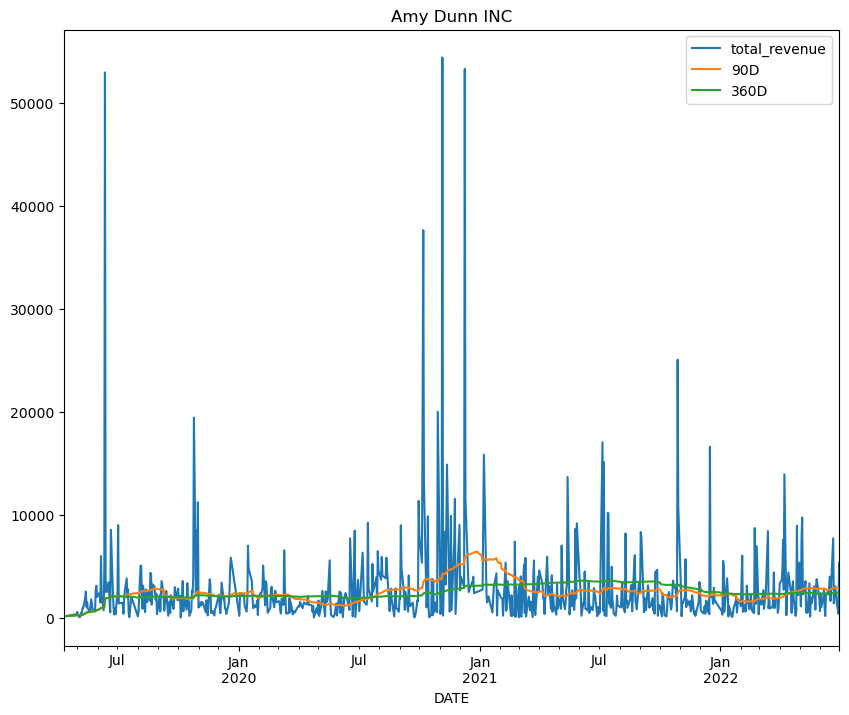

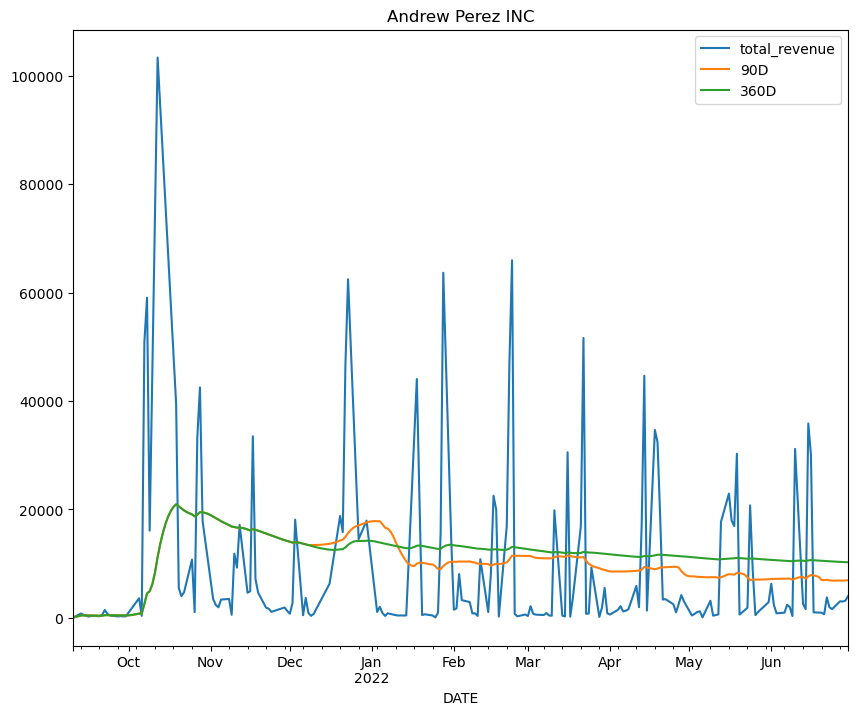

...

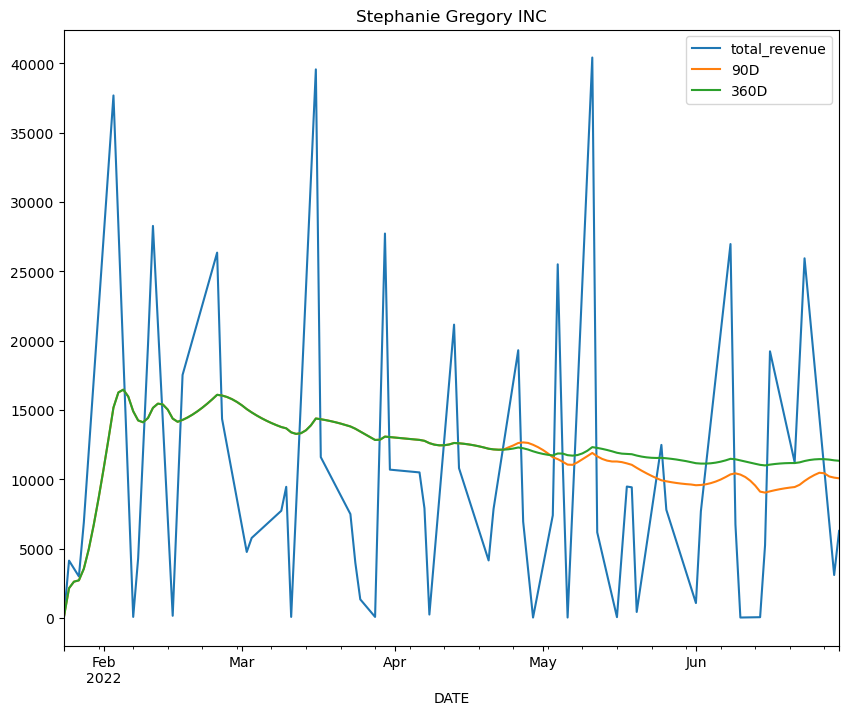

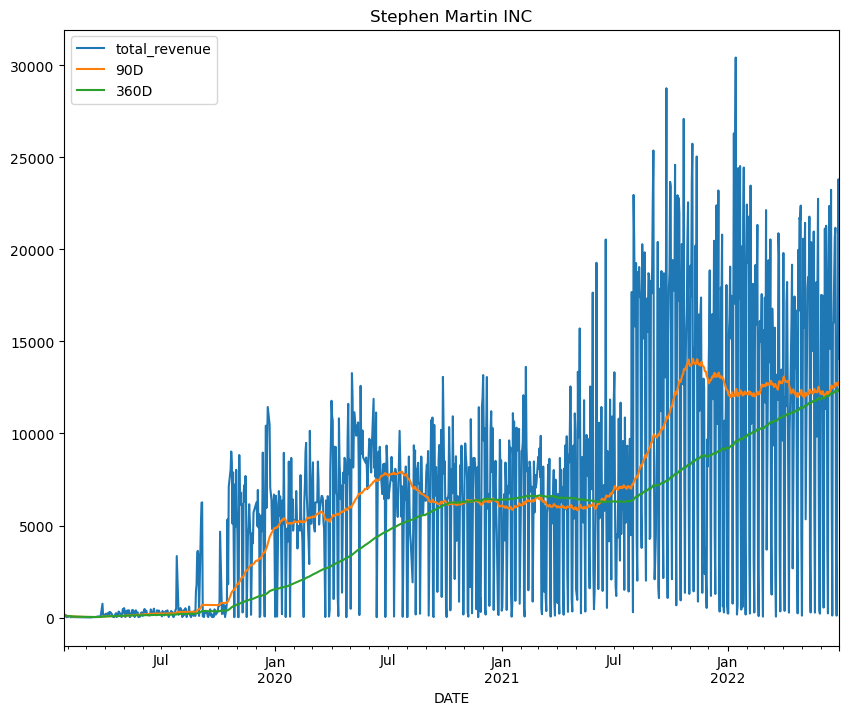

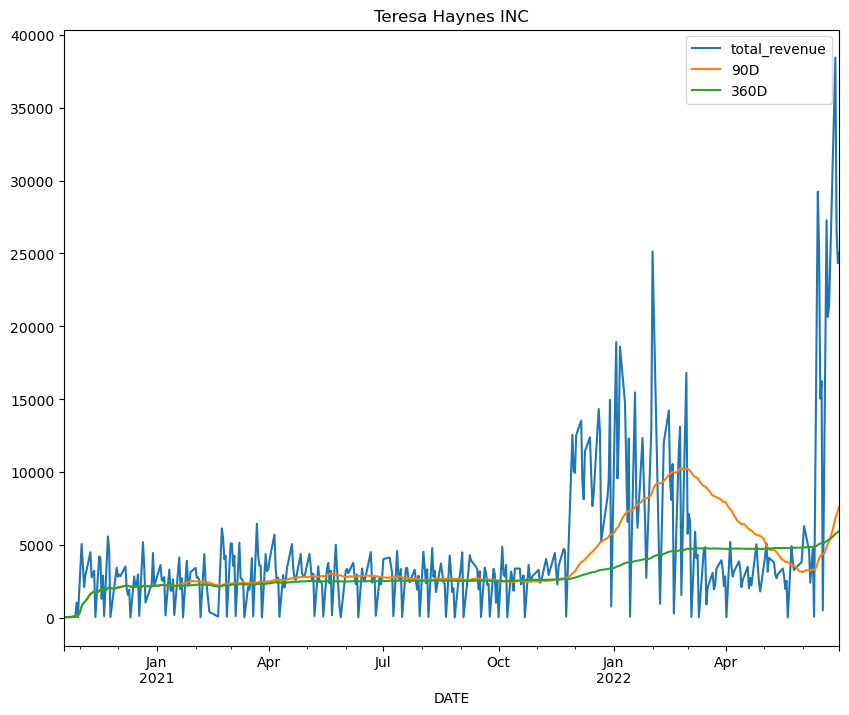

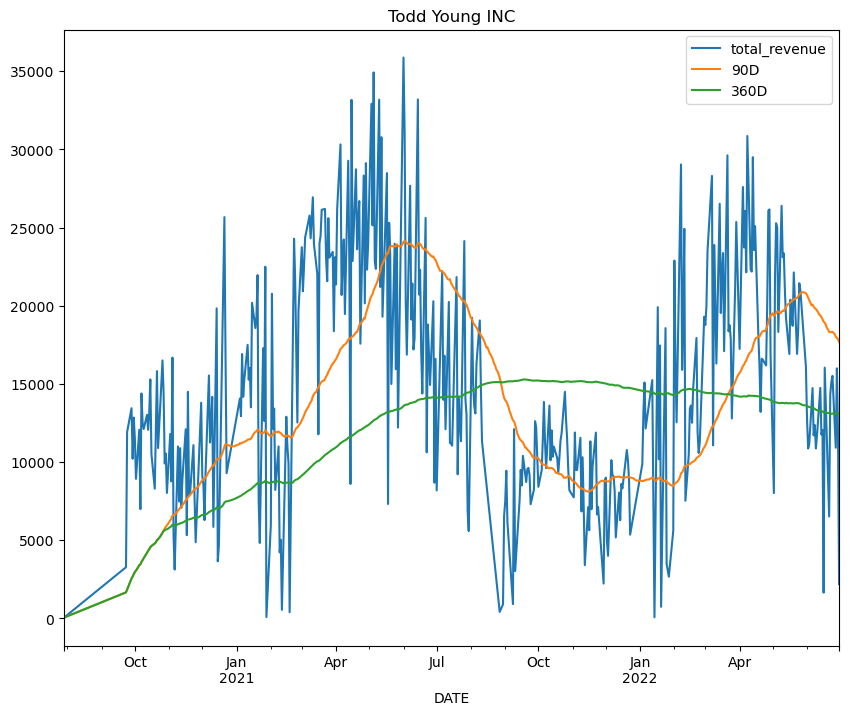

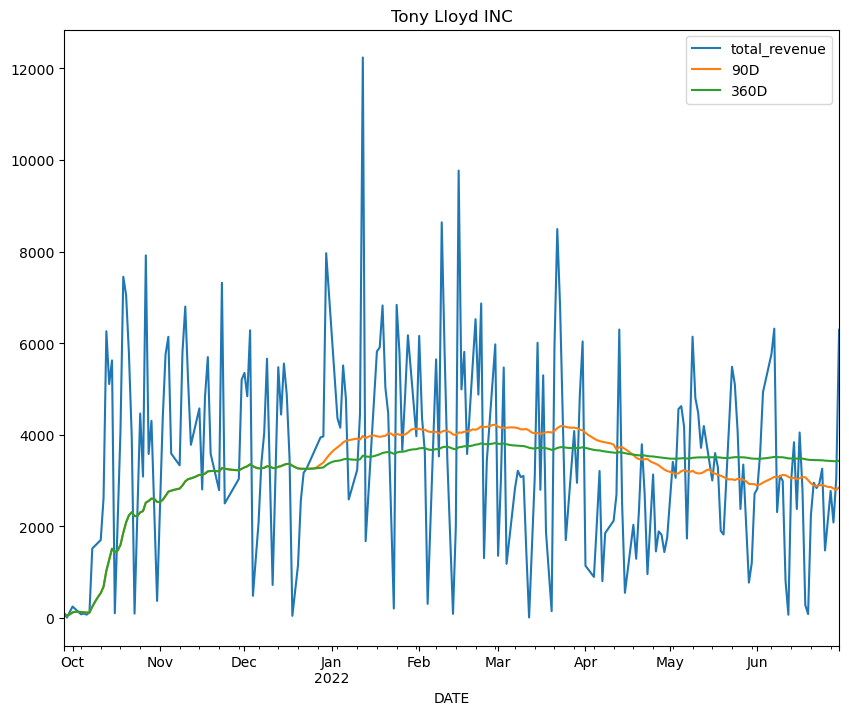

In [11]:
#Rolling windows help us see long term trends that are hard to spot in the original data. We can see trends
#of every season (90 days) and year(360 days)
for i in unique_clients:
    
    client_name = data[data['anonimized_name'] == i]
    client_name = client_name.resample('D').interpolate('linear')
    client_name['90D'] = client_name.total_revenue.rolling('90D').mean()
    client_name['360D'] = client_name.total_revenue.rolling('360D').mean()
    client_name.loc[:,['total_revenue','90D','360D']].plot()
    plt.title(i)
    

In [12]:
#data in fbprophet format
data = data.reset_index()

In [13]:
data.head()

,DATE,NAICS_DESC,anonimized_name,total_revenue
0,2020-10-20,Offices of Lawyers,Aaron Walker INC,40
1,2020-11-12,Offices of Lawyers,Aaron Walker INC,18
2,2020-11-13,Offices of Lawyers,Aaron Walker INC,18
3,2020-11-30,Offices of Lawyers,Aaron Walker INC,820
4,2020-12-01,Offices of Lawyers,Aaron Walker INC,213


In [14]:
data_final = data[['DATE', 'total_revenue', 'anonimized_name']].rename({'DATE':'ds','total_revenue':'y'}, axis='columns')

In [15]:
clients = data_final.groupby('anonimized_name')

In [16]:
clients.head()

,ds,y,anonimized_name
0,2020-10-20,40,Aaron Walker INC
1,2020-11-12,18,Aaron Walker INC
2,2020-11-13,18,Aaron Walker INC
3,2020-11-30,820,Aaron Walker INC
4,2020-12-01,213,Aaron Walker INC
...,...,...,...
23274,2021-09-28,98,Tony Lloyd INC
23275,2021-09-29,13,Tony Lloyd INC
23276,2021-10-01,253,Tony Lloyd INC
23277,2021-10-04,84,Tony Lloyd INC


In [17]:
target = pd.DataFrame()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -8.18333
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       619.716   3.49592e-05       91.5038      0.1756           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       619.736   5.12056e-05       88.2646   5.781e-07       0.001      211  LS failed, Hessian reset 
     183        619.74    3.4071e-06       87.2927   3.842e-08       0.001      321  LS failed, Hessian reset 
     198        619.74   6.06665e-08       67.6796      0.2718      0.8779      344   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -9.04002
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       126.113   1.02203e-06       96.0872           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       126.116   5.23868e-09       106.571      0.6521      0.6521      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new


Initial log joint probability = -48.8947
Iteration  1. Log joint probability =    85.3888. Improved by 134.284.
Iteration  2. Log joint probability =    114.838. Improved by 29.4491.
Iteration  3. Log joint probability =    129.974. Improved by 15.1365.
Iteration  4. Log joint probability =    130.822. Improved by 0.848099.
Iteration  5. Log joint probability =    130.874. Improved by 0.0514049.
Iteration  6. Log joint probability =    130.899. Improved by 0.0254133.
Iteration  7. Log joint probability =    130.918. Improved by 0.0187097.
Iteration  8. Log joint probability =        131. Improved by 0.0818464.
Iteration  9. Log joint probability =    131.119. Improved by 0.119225.
Iteration 10. Log joint probability =    131.155. Improved by 0.0358369.
Iteration 11. Log joint probability =    131.158. Improved by 0.0031537.
Iteration 12. Log joint probability =    131.167. Improved by 0.00929956.
Iteration 13. Log joint probability =    131.183. Improved by 0.0151833.
Iteration 14. Lo

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -4.75045
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       1376.91   9.03266e-05       97.1158   9.751e-07       0.001      161  LS failed, Hessian reset 
      99       1376.92   2.31668e-05       94.3952      0.7487      0.7487      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       1376.94   1.02942e-07          82.4           1           1      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -4.6378
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66        267.76   0.000359849        99.838    3.88e-06       0.001      116  LS failed, Hessian reset 
      99       267.796   4.25631e-07       105.381      0.7118      0.7118      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       267.796   8.82148e-09        98.758      0.5907      0.5907      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -14.2931
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       686.215    0.00268176       98.8081           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       686.693    0.00190208       97.5021   1.613e-05       0.001      191  LS failed, Hessian reset 
     199       686.825   3.26265e-08        51.784     0.05114           1      322   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/o

Initial log joint probability = -5.39918
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       856.548    0.00175125       123.723   2.634e-05       0.001      104  LS failed, Hessian reset 
      75       856.665   3.79592e-05       63.8076   5.959e-07       0.001      166  LS failed, Hessian reset 
      99       856.671   3.45731e-06       58.7696      0.1599       0.511      198   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153        856.86    0.00108087        73.479   1.955e-05       0.001      312  LS failed, Hessian reset 
     199       857.032   2.57161e-06       65.9736           1           1      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       857.046   2.22747e-06       66.6359      0.2804           1      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:n_changepoints greater than number of observations. Using 17.



Initial log joint probability = -9.14231
Iteration  1. Log joint probability =    1.71086. Improved by 10.8532.
Iteration  2. Log joint probability =    3.34149. Improved by 1.63063.
Iteration  3. Log joint probability =    18.2435. Improved by 14.902.
Iteration  4. Log joint probability =    18.2867. Improved by 0.0431504.
Iteration  5. Log joint probability =    18.3605. Improved by 0.0737853.
Iteration  6. Log joint probability =     18.424. Improved by 0.0634898.
Iteration  7. Log joint probability =    18.4599. Improved by 0.0359374.
Iteration  8. Log joint probability =    18.4776. Improved by 0.0176559.
Iteration  9. Log joint probability =    18.6063. Improved by 0.128712.
Iteration 10. Log joint probability =    18.7759. Improved by 0.169649.
Iteration 11. Log joint probability =    18.8461. Improved by 0.0701973.
Iteration 12. Log joint probability =    19.8442. Improved by 0.998052.
Iteration 13. Log joint probability =    19.9709. Improved by 0.12673.
Iteration 14. Log joi

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and w

Initial log joint probability = -16.5215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       647.698    0.00263737       69.8328      0.2761           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       648.209   0.000390337        65.482   5.473e-06       0.001      235  LS failed, Hessian reset 
     199       648.779   0.000377739       64.2689      0.7114      0.7114      322   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       648.957   0.000229241       55.6809           1           1      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     313       648.959   2.73213e-06       73.1549   3.951e-08       0.001      501  LS failed, Hessian reset 
     345       648.959   1.62698e-07       69.9365   2.403e-09       0.001      583  LS failed, Hessian rese

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -3.96834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      32       358.699   0.000311957       65.5722    5.12e-06       0.001       78  LS failed, Hessian reset 
      62       358.724   2.23426e-06       67.0235   3.721e-08       0.001      158  LS failed, Hessian reset 
      82       358.724   1.01802e-08       65.9741       0.315           1      194   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -2.95317
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2007.68   9.76911e-06       81.5131      0.6972      0.6972      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       2007.78   0.000162996       100.746   1.905e-06       0.001      326  LS failed, Hessian reset 
     199       2007.78   8.40886e-05       84.5123       0.257           1      332   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     275       2007.84   3.85323e-06        78.046     4.2e-08       0.001      473  LS failed, Hessian reset 
     299       2007.84   9.70124e-06        64.127      0.9241      0.9241      500   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     346       2007.84   2.17937e-07       62.5715      0.5284      0.5284      558   
Optimization terminat

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: Future

Initial log joint probability = -4.59008
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       1819.29   0.000148145       61.7915   1.858e-06       0.001      116  LS failed, Hessian reset 
      99        1819.3   2.72902e-05       67.9515           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       1819.37   0.000356935       132.971   3.093e-06       0.001      228  LS failed, Hessian reset 
     177        1819.4    5.9929e-08       56.8901     0.03664           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'yearly_upper_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'yearly_x', 'yearly_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = c

Initial log joint probability = -5.99917
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       1525.99    0.00036968        67.411   6.017e-06       0.001      162  LS failed, Hessian reset 
      99          1526   1.18384e-05       50.3249      0.5038      0.5038      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133          1526   1.83807e-05       87.6176   2.635e-07       0.001      259  LS failed, Hessian reset 
     151          1526   1.18022e-07       58.5255      0.1601      0.3435      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -7.49677
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       384.774   2.57703e-06       66.8084      0.4336      0.4336      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       384.777   3.72777e-05       78.3677   4.938e-07       0.001      170  LS failed, Hessian reset 
     131       384.778    1.0921e-08       63.6572      0.2077      0.2077      211   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/o

Initial log joint probability = -80.7542
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       1219.64     0.0009263       105.803   5.586e-06       0.001      165  LS failed, Hessian reset 
      99       1219.74    0.00178183       103.629           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       1219.96   0.000234082       69.7919   3.738e-06       0.001      226  LS failed, Hessian reset 
     186          1220   4.82295e-05       66.2585   7.048e-07       0.001      373  LS failed, Hessian reset 
     199          1220   2.63749e-06       68.0422       0.697       0.697      392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218          1220    9.1924e-08       71.8805      0.2379           1      421   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yearly_x', 'yearly_upper_x', 'yearly_lower_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -10.865
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       997.704   0.000340993       54.0689   4.252e-06       0.001      147  LS failed, Hessian reset 
      99        997.72   1.79302e-05       64.7717      0.5226           1      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       997.721   3.73422e-06       56.2363   6.758e-08       0.001      235  LS failed, Hessian reset 
     143       997.721   7.19401e-07       41.4101   1.476e-08       0.001      310  LS failed, Hessian reset 
     154       997.721   5.83264e-08       53.1329     0.05144           1      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -2.70102
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       350.621   0.000291985       71.6488   3.489e-06       0.001      137  LS failed, Hessian reset 
      99       350.638   8.13905e-05       79.5068           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       350.638   2.15186e-05       78.1077   2.869e-07       0.001      206  LS failed, Hessian reset 
     136       350.639   4.95448e-09       67.2632      0.2109      0.2109      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -10.5038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       895.023    0.00049614       65.9083      0.3826      0.3826      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       896.321    0.00387494       171.174   3.601e-05       0.001      210  LS failed, Hessian reset 
     198       897.324   0.000869579       73.6119     1.3e-05       0.001      320  LS failed, Hessian reset 
     199       897.327   0.000366401       66.3792      0.7927      0.7927      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        897.98   1.47584e-06       53.4802           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     337       897.981   6.36295e-06       71.3684   8.575e-08       0.001      552  LS failed, Hessian rese

/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -5.58188
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       333.414   1.34596e-06       87.7597      0.8161      0.8161      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       333.416   2.85114e-05       102.749   2.916e-07       0.001      204  LS failed, Hessian reset 
     182       333.419   6.54905e-07       91.4744   6.785e-09       0.001      306  LS failed, Hessian reset 
     191       333.419   6.30011e-09       83.7184      0.2253      0.2253      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -18.5836
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1137.57     0.0025203       69.1885           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1137.75   2.97558e-05       57.1449      0.4571      0.4571      264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       1137.88   0.000958622       77.6703   1.642e-05       0.001      369  LS failed, Hessian reset 
     299       1137.99   2.55325e-05       72.6351           1           1      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       1137.99   8.96308e-06       91.6517   1.273e-07       0.001      562  LS failed, Hessian reset 
     358       1137.99   7.81358e-08       51.9679      0.3153           1      585   
Optimization terminat

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'multiplicative_terms_x', 'yearly_upper_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'yearly_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'trend_upper_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'ye

Initial log joint probability = -39.4295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       1604.18     0.0040649       174.097   3.432e-05       0.001      133  LS failed, Hessian reset 
      99       1605.09   0.000534462       70.5104           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143        1605.7    0.00154842       164.934   1.215e-05       0.001      237  LS failed, Hessian reset 
     199       1606.76    0.00291713       81.2092      0.3092           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1608.49   3.53102e-05       81.6279      0.4327      0.4327      429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1611.04     0.0186398       89.0592      0.2241           1      539   
    Iter      log pro

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling daily seasonality. Run prophet with d

Initial log joint probability = -11.1335
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1905.05    0.00456398       152.958      0.4952      0.4952      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       1905.91   0.000186301       67.8826   2.339e-06       0.001      273  LS failed, Hessian reset 
     199       1905.92   1.59194e-06       76.4595     0.09697           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       1905.92   1.45933e-07       51.2514      0.4206           1      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'yearly_upper_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'yearly_x', 'yearly_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = c

Initial log joint probability = -5.69004
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1270.09   0.000249739       85.9022      0.7676      0.7676      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1270.22   3.56534e-05       77.0803       1.984      0.5006      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     254       1270.24   1.69529e-07       81.0576      0.3069           1      322   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -5.72137
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       786.682     0.0017465       95.4091   1.859e-05       0.001      152  LS failed, Hessian reset 
      99       786.806    0.00116245       97.1629           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       787.141   0.000250153       74.8961     3.5e-06       0.001      323  LS failed, Hessian reset 
     199       787.195   4.97039e-05       70.6715      0.3484           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        787.21   3.09238e-08         78.56      0.3864      0.3864      468   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'yearly_upper_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'yearly_x', 'yearly_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is dep

Initial log joint probability = -5.18381
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       413.349   0.000242143       70.9375   3.206e-06       0.001      113  LS failed, Hessian reset 
      99       413.408    0.00120966       48.9522      0.3147           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       413.414   0.000206418       51.1911   3.208e-06       0.001      225  LS failed, Hessian reset 
     199       413.467   4.71979e-07       58.2309      0.7516      0.7516      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     286       413.511    0.00011721        63.829   1.594e-06       0.001      510  LS failed, Hessian reset 
     299       413.553   6.80727e-05       61.6579           1           1      524   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -14.7995
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       1072.13     0.0024402       67.0527   2.677e-05       0.001      157  LS failed, Hessian reset 
      99       1072.13   0.000353603       23.9658      0.3265      0.8553      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       1072.19   0.000264064       43.7647   5.018e-06       0.001      225  LS failed, Hessian reset 
     148       1072.21   5.49815e-05       65.9834   8.099e-07       0.001      312  LS failed, Hessian reset 
     171       1072.21   1.88731e-06       61.2404   3.297e-08       0.001      381  LS failed, Hessian reset 
     178       1072.21   2.00174e-07       36.7431           1           1      393   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/o

Initial log joint probability = -15.2104
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       834.499   0.000202807       74.7129   2.595e-06       0.001       97  LS failed, Hessian reset 
      92       834.516   2.92051e-07       77.5265   4.006e-09       0.001      201  LS failed, Hessian reset 
      99       834.516   3.53355e-08       74.0993      0.2233           1      212   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yearly_x', 'yearly_upper_x', 'yearly_lower_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -12.8757
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       990.103    0.00121504       76.5704           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       990.162     4.991e-08       65.7853           1           1      195   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -5.87735
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       534.615    0.00213599       85.5103   2.341e-05       0.001      155  LS failed, Hessian reset 
      99       534.666   0.000301865       58.6688      0.9925      0.2489      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       534.694   6.63367e-05       71.9338   8.907e-07       0.001      281  LS failed, Hessian reset 
     199       534.697    1.1782e-06       82.6048       2.237      0.2237      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       534.697   2.52813e-06       63.7357   2.753e-08       0.001      399  LS failed, Hessian reset 
     224       534.697   3.50327e-08       64.2618           1           1      425   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -9.72694
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       2212.34   0.000355426       104.634   3.847e-06       0.001      148  LS failed, Hessian reset 
      99       2212.36   8.15549e-05       64.4805           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175        2212.7    0.00245349       92.5153   2.254e-05       0.001      289  LS failed, Hessian reset 
     199       2212.79   5.04958e-06       64.3466           1           1      327   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227        2212.8   6.13624e-05       74.6298   7.614e-07       0.001      404  LS failed, Hessian reset 
     253       2212.81   5.71315e-08       66.9594      0.5405      0.5405      440   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'multiplicative_terms_x', 'yearly_upper_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'yearly_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'trend_upper_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'ye

Initial log joint probability = -2.95307
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2050.47   0.000271216       80.9011      0.2668       0.831      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       2050.52   0.000251452       82.1755   3.212e-06       0.001      191  LS failed, Hessian reset 
     132       2050.54   1.23001e-05       76.6865   1.889e-07       0.001      251  LS failed, Hessian reset 
     157       2050.54   1.61259e-07       77.2185      0.4923      0.4923      282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -3.83329
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       173.671   8.32915e-06       82.9907   8.295e-08       0.001      155  LS failed, Hessian reset 
      99       173.673    1.9497e-06       92.9639           1           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       173.673   9.24346e-09       94.0093      0.7633      0.7633      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/o

Initial log joint probability = -5.0701
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       1196.19   0.000117749       82.4598   1.499e-06       0.001      123  LS failed, Hessian reset 
      99       1196.21   7.78667e-06       72.6942      0.9551      0.9551      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       1196.21    8.3747e-08       71.8582           1           1      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yearly_x', 'yearly_upper_x', 'yearly_lower_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be 

Initial log joint probability = -9.82215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       793.885    0.00170587       86.7525      0.3969           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       794.723     0.0034662       104.559   3.651e-05       0.001      227  LS failed, Hessian reset 
     199       794.992   1.17624e-05       99.0914           1           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        795.16   1.99748e-05       96.2952           1           1      407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       795.214    2.1134e-05       84.1559           1           1      533   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       795.222   4.98641e-06    

/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -3.33643
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       387.851   0.000187223        64.544    2.96e-06       0.001      127  LS failed, Hessian reset 
      99        387.87   4.14868e-06       58.7301      0.3406      0.3406      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198        388.03    0.00017828       71.9969   3.312e-06       0.001      362  LS failed, Hessian reset 
     199       388.033   7.30704e-05        57.658           1           1      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       388.066     5.803e-06       80.9926   7.776e-08       0.001      460  LS failed, Hessian reset 
     267       388.066   7.50908e-09       64.7116     0.02094      0.8478      492   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -5.48685
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       858.172   0.000177539        78.373   2.346e-06       0.001      147  LS failed, Hessian reset 
      93       858.178   3.25106e-07       82.1968   5.333e-09       0.001      227  LS failed, Hessian reset 
      99       858.178   2.50139e-07       63.0875           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       858.178   1.45724e-06       56.6208   1.876e-08       0.001      296  LS failed, Hessian reset 
     134       858.178   5.91032e-08       64.7242           1           1      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -9.4935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.758   2.37971e-05       75.8666       0.701       0.701      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       352.777    0.00237551       70.6779   2.944e-05       0.001      277  LS failed, Hessian reset 
     199       352.869   5.84134e-05       84.8843      0.5258      0.5258      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       352.893   0.000139517        81.142   1.773e-06       0.001      342  LS failed, Hessian reset 
     269       352.904    6.3682e-09       74.1533      0.1576      0.4327      420   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:fbprophet:n_changepoints greater than number of observations. Using 1.



Initial log joint probability = -27.5512
Iteration  1. Log joint probability =   0.491711. Improved by 28.0429.
Iteration  2. Log joint probability =    3.21014. Improved by 2.71843.
Iteration  3. Log joint probability =    5.42648. Improved by 2.21634.
Iteration  4. Log joint probability =    7.62807. Improved by 2.20159.
Iteration  5. Log joint probability =    9.84685. Improved by 2.21878.
Iteration  6. Log joint probability =    12.0576. Improved by 2.2108.
Iteration  7. Log joint probability =    12.8818. Improved by 0.824185.
Iteration  8. Log joint probability =    15.6935. Improved by 2.81166.
Iteration  9. Log joint probability =    17.5988. Improved by 1.90528.
Iteration 10. Log joint probability =    19.8394. Improved by 2.24066.
Iteration 11. Log joint probability =     20.327. Improved by 0.487564.
Iteration 12. Log joint probability =    23.5409. Improved by 3.21392.
Iteration 13. Log joint probability =    25.4677. Improved by 1.92678.
Iteration 14. Log joint probabilit

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and w

Initial log joint probability = -31.6483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1379.24    0.00542625       163.823      0.3986       0.947      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1389.71    0.00858925       68.7096     0.03958           1      267   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     295       1390.97   8.74678e-05       75.2216   1.571e-06       0.001      440  LS failed, Hessian reset 
     299       1390.97   2.85449e-05       64.8774      0.2431           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       1392.38    0.00105293       146.569   5.196e-06       0.001      612  LS failed, Hessian reset 
     399       1392.98   0.000385225       50.4496      0.9415      0.9415      627   
    Iter      log pro

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yearly_x', 'yearly_upper_x', 'yearly_lower_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Initial log joint probability = -3.0665
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       692.969   0.000125044       80.0584   1.376e-06       0.001      117  LS failed, Hessian reset 
      99        692.98   6.54428e-08        82.939       0.261       0.261      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       692.981   4.75676e-09       76.1185      0.1659      0.1659      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/o

Initial log joint probability = -11.552
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86        858.47    0.00194444       104.891   2.082e-05       0.001      138  LS failed, Hessian reset 
      99       858.563   2.91451e-05       71.6216      0.5598      0.5598      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       858.633   1.99715e-06        77.259           1           1      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     253       858.637   3.21391e-07       60.2438      0.6035      0.6035      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -7.82462
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       725.678   4.05808e-06       90.7737      0.6287      0.6287      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       725.697   0.000202096       105.043           1           1      260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       725.745    8.9024e-06       96.8491    8.64e-08       0.001      343  LS failed, Hessian reset 
     286       725.747   1.59797e-08        96.044      0.7107      0.7107      399   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -23.6848
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       892.194    0.00229874       146.441   1.664e-05       0.001      168  LS failed, Hessian reset 
      99       892.669   0.000244146       60.2293       1.958      0.1958      187   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       892.714   0.000135549       70.3757   1.821e-06       0.001      252  LS failed, Hessian reset 
     199       893.683   0.000206764       54.6546      0.2005      0.5314      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       893.691   0.000117711       67.6902    1.37e-06       0.001      389  LS failed, Hessian reset 
     263       893.727   0.000168046       74.5655    1.71e-06       0.001      497  LS failed, Hessian reset 
     299       893.738   2.06016e-06       75.8293      0.2476   

/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yearly_x', 'yearly_upper_x', 'yearly_lower_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Initial log joint probability = -18.4102
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       474.563    0.00220688       74.2429      0.8152      0.8152      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       474.611   9.12241e-06       61.1454   1.111e-07       0.001      244  LS failed, Hessian reset 
     199       474.612   3.62327e-08       51.7027           1           1      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       474.612    8.3936e-09       58.5391      0.1139           1      308   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/o

Initial log joint probability = -12.586
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       949.805    1.0803e-05       66.8499       0.537       0.537      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       949.808   1.59331e-05        70.742   2.171e-07       0.001      209  LS failed, Hessian reset 
     146       949.809   3.29043e-06       70.8375   4.216e-08       0.001      262  LS failed, Hessian reset 
     169        949.81   4.69772e-08       73.0162      0.1576           1      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new


Initial log joint probability = -27.2088
Iteration  1. Log joint probability =    36.5915. Improved by 63.8004.
Iteration  2. Log joint probability =    54.6876. Improved by 18.0961.
Iteration  3. Log joint probability =    55.7487. Improved by 1.06104.
Iteration  4. Log joint probability =     56.033. Improved by 0.284285.
Iteration  5. Log joint probability =    56.0652. Improved by 0.0322498.
Iteration  6. Log joint probability =    56.1047. Improved by 0.0394534.
Iteration  7. Log joint probability =    56.1215. Improved by 0.0168725.
Iteration  8. Log joint probability =    56.1504. Improved by 0.0288855.
Iteration  9. Log joint probability =     56.199. Improved by 0.0485528.
Iteration 10. Log joint probability =    56.2784. Improved by 0.0794193.
Iteration 11. Log joint probability =     56.296. Improved by 0.0176133.
Iteration 12. Log joint probability =    56.3004. Improved by 0.00440265.
Iteration 13. Log joint probability =    56.3615. Improved by 0.0610805.
Iteration 14. L

/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -17.8966
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81        1742.6    0.00136433       66.2421   2.466e-05       0.001      153  LS failed, Hessian reset 
      99       1742.82    0.00200992       56.8326      0.7399      0.7399      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       1742.91   0.000172295       66.8867   2.518e-06       0.001      296  LS failed, Hessian reset 
     199       1742.99    6.8176e-05       56.2438      0.7982      0.7982      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       1743.01   1.78787e-06       60.9284      0.8503      0.8503      470   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yearly_x', 'yearly_upper_x', 'yearly_lower_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Initial log joint probability = -15.8796
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       633.798     0.0015473       99.2768   1.861e-05       0.001      157  LS failed, Hessian reset 
      99       633.874   0.000249212       86.3444      0.2368      0.8783      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        633.93   5.67845e-08       72.6136      0.2651      0.2651      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209        633.93    5.8521e-09       78.6442      0.1618      0.1618      309   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

Initial log joint probability = -40.7056
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       465.982   0.000109679       79.0153      0.3746           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       466.606    0.00215161       80.7455   3.013e-05       0.001      185  LS failed, Hessian reset 
     199       466.763   1.74486e-06       64.3386           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     270       466.772   1.05811e-06       63.1455   1.664e-08       0.001      438  LS failed, Hessian reset 
     299       466.772   1.07336e-07       74.5137      0.8153      0.8153      478   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     310       466.775   3.45519e-05       72.1715   4.423e-07       0.001      540  LS failed, Hessian rese

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mariiamohyla/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new

Initial log joint probability = -8.24532
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       294.965    0.00175157       78.6973      0.4353      0.4353      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       295.528   0.000267475       69.3036   3.553e-06       0.001      231  LS failed, Hessian reset 
     178       295.542   2.37408e-05       83.9244   3.756e-07       0.001      318  LS failed, Hessian reset 
     199       295.543   7.76324e-08       70.6105      0.7615      0.7615      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       295.543   4.16007e-09       60.8282     0.05788      0.1762      361   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/var/folders/s9/m7vhxbcx7p7fsnsxdm31n45w0000gn/T/ipykernel_19524/574404003.py:9: FutureWarning: Passing 'suffixes' which cause duplicate columns {'yhat_lower_x', 'trend_lower_x', 'multiplicative_terms_lower_x', 'weekly_x', 'trend_x', 'additive_terms_lower_x', 'weekly_upper_x', 'additive_terms_upper_x', 'additive_terms_x', 'multiplicative_terms_x', 'yhat_upper_x', 'multiplicative_terms_upper_x', 'weekly_lower_x', 'trend_upper_x'} in the result is deprecated and will raise a MergeError in a future version.
  target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)


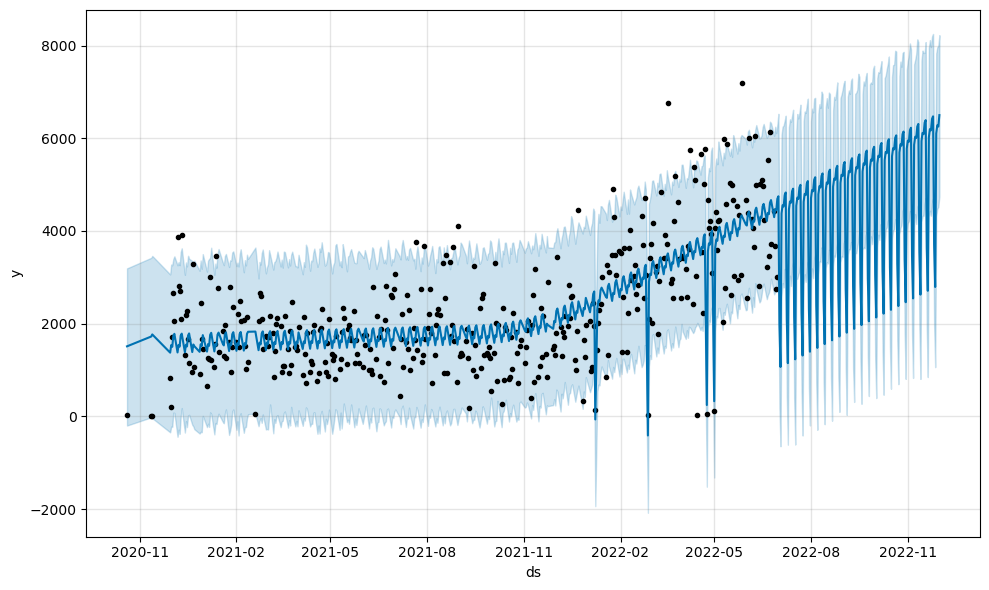

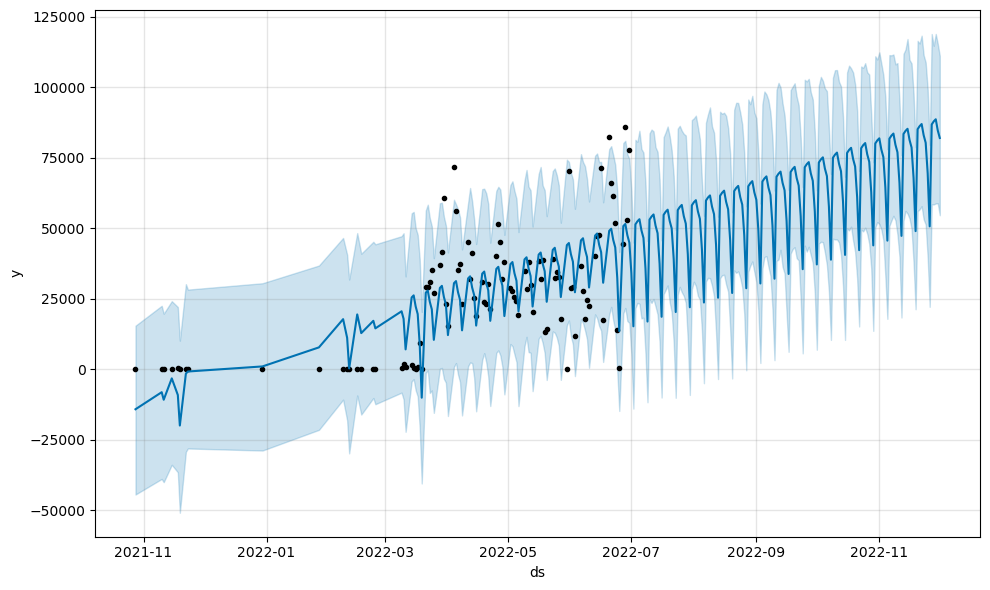

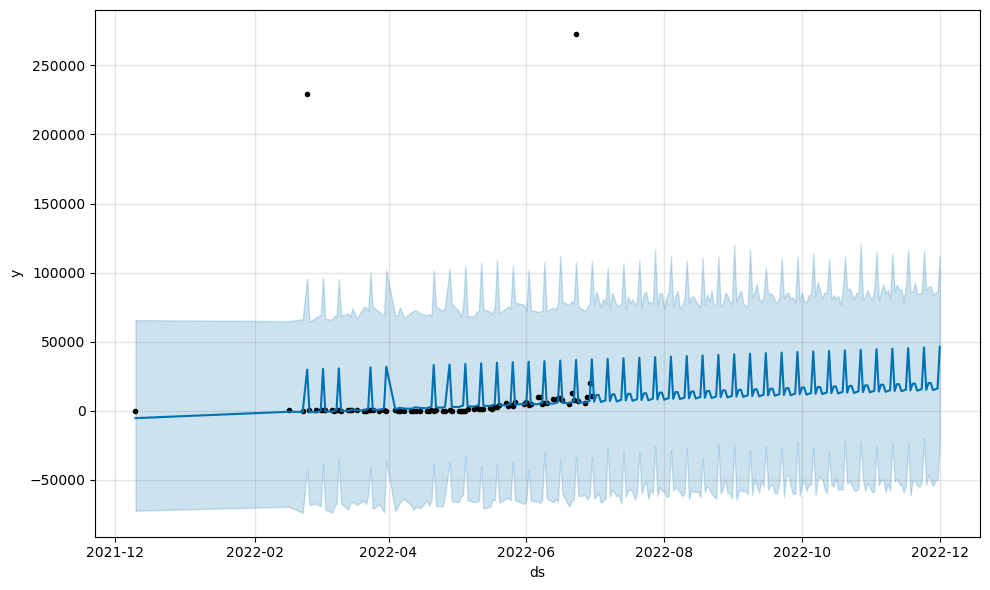

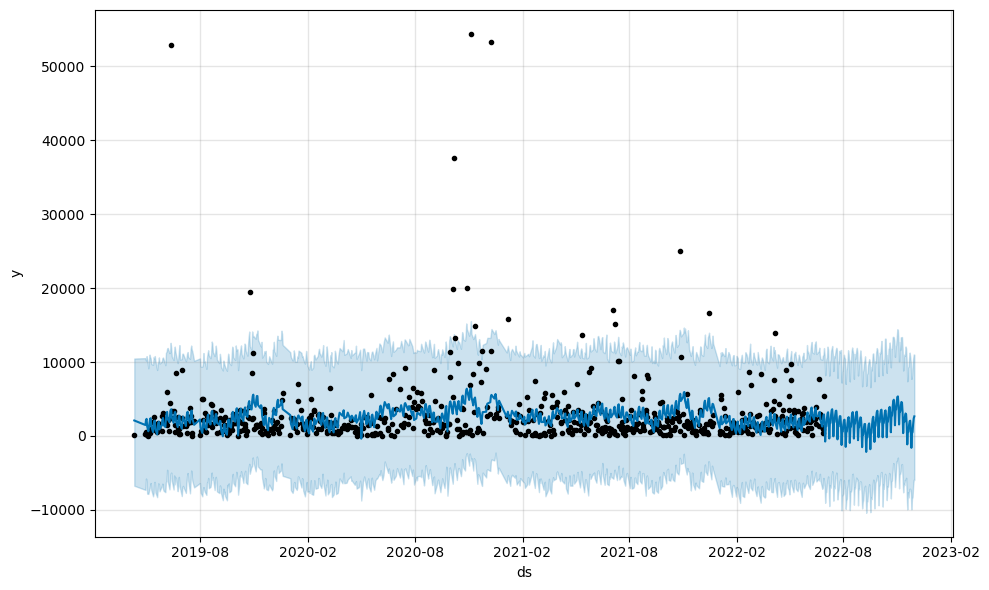

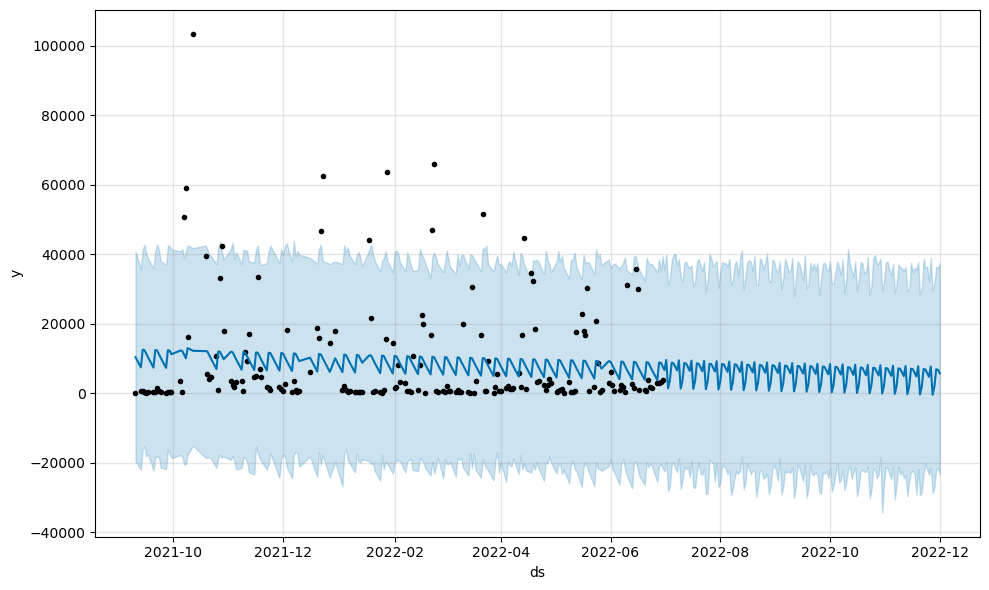

...

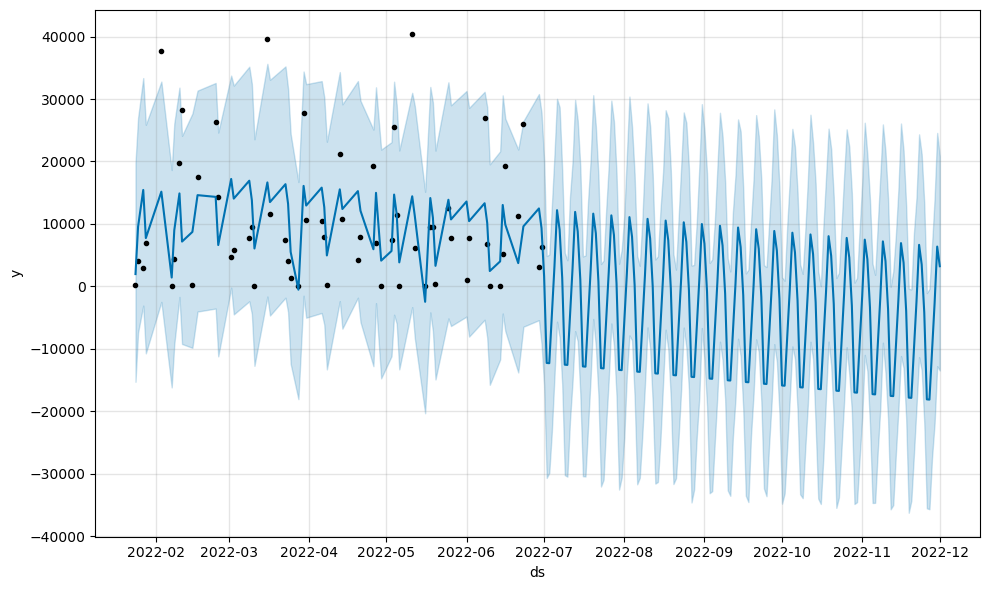

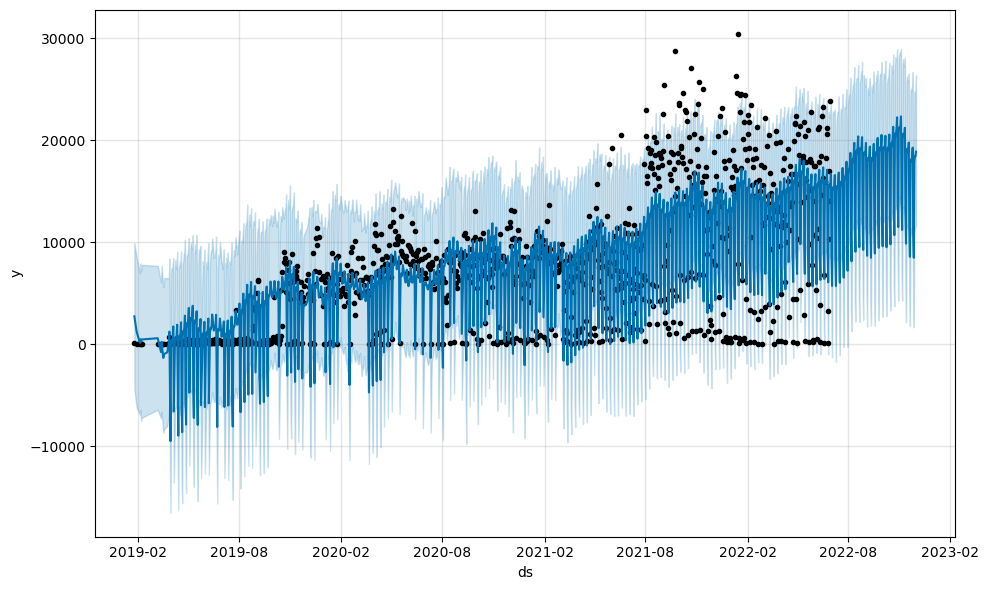

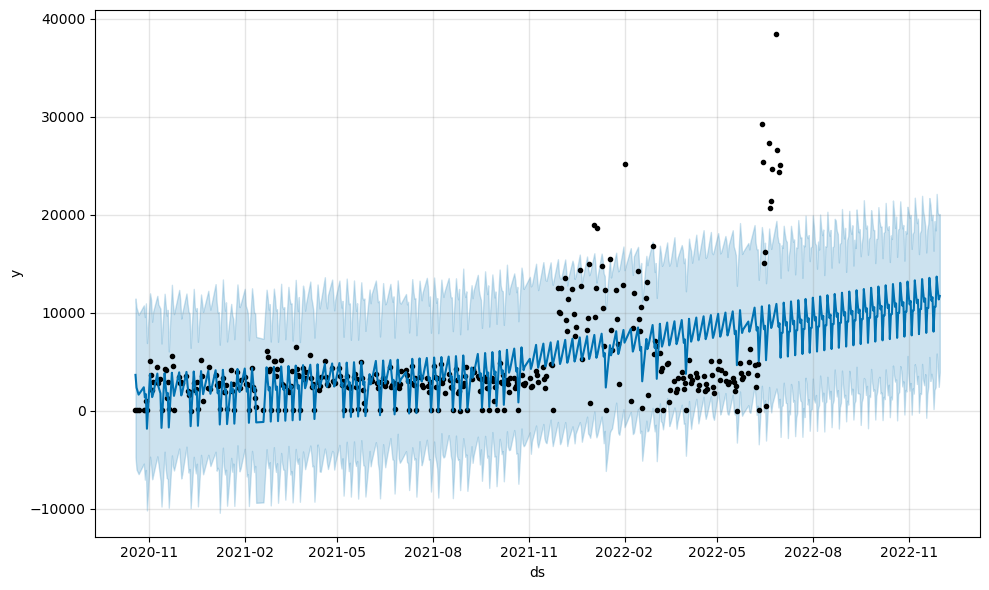

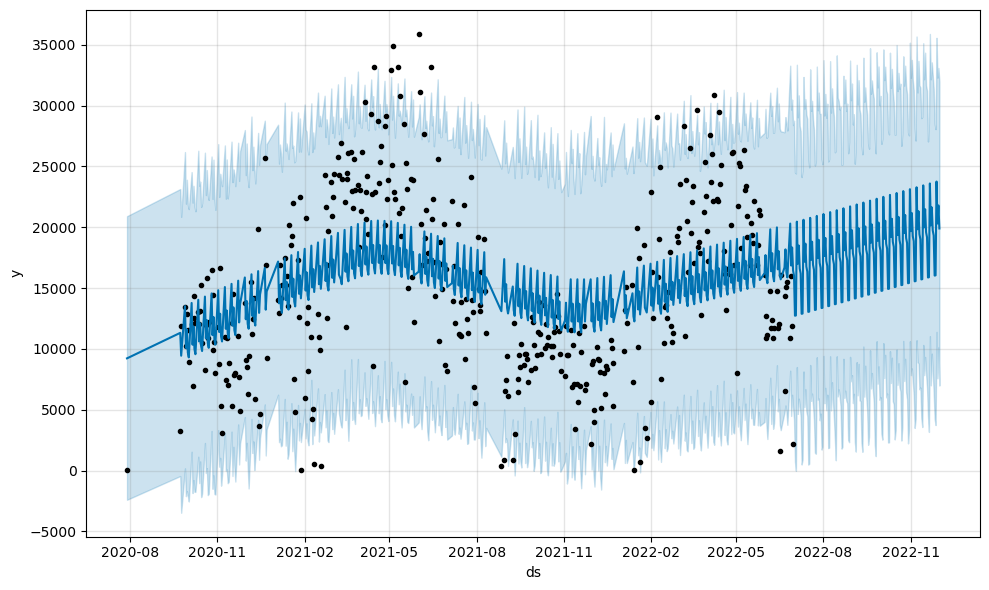

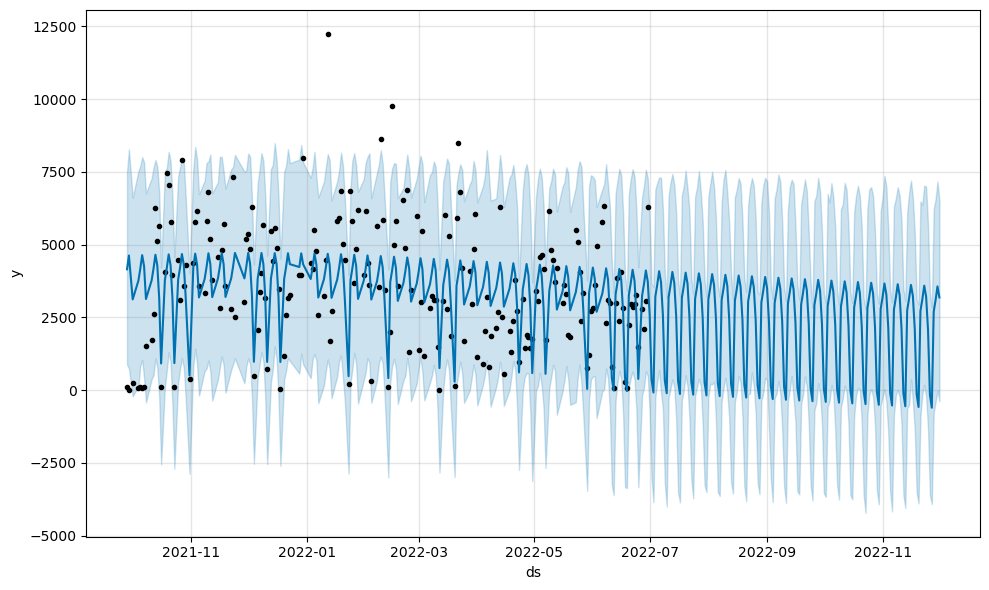

In [18]:
for client in clients.groups:
    group = clients.get_group(client)
    m = Prophet(interval_width=0.95)
    m.fit(group)
    future = m.make_future_dataframe(periods=154)
    forecast = m.predict(future)
    m.plot(forecast)
    forecast = forecast.rename(columns={'yhat': 'yhat_'+client})
    target=pd.merge(target, forecast.set_index('ds'), how='outer', left_index=True, right_index=True)

In [19]:
target

,trend_x,yhat_lower_x,yhat_upper_x,trend_lower_x,trend_upper_x,additive_terms_x,additive_terms_lower_x,additive_terms_upper_x,weekly_x,weekly_lower_x,...,additive_terms_y,additive_terms_lower_y,additive_terms_upper_y,weekly_y,weekly_lower_y,weekly_upper_y,multiplicative_terms_y,multiplicative_terms_lower_y,multiplicative_terms_upper_y,yhat_Tony Lloyd INC
ds,,,,,,,,,,,,,,,,,,,,,
2018-08-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-27,5433.314018,1062.086265,4615.663947,5156.138544,5724.171564,-2641.841655,-2641.841655,-2641.841655,-2641.841655,-2641.841655,...,-2585.772777,-2585.772777,-2585.772777,-2585.772777,-2585.772777,-2585.772777,0.0,0.0,0.0,-604.679379
2022-11-28,5445.048444,4316.939015,7832.016651,5165.025287,5739.345269,660.493819,660.493819,660.493819,660.493819,660.493819,...,717.118283,717.118283,717.118283,717.118283,717.118283,717.118283,0.0,0.0,0.0,2694.664570
2022-11-29,5456.782869,4476.776208,7961.900338,5173.912031,5754.518975,822.791813,822.791813,822.791813,822.791813,822.791813,...,1122.750619,1122.750619,1122.750619,1122.750619,1122.750619,1122.750619,0.0,0.0,0.0,3096.749796


In [20]:
target = target[['yhat_' + client for client in clients.groups.keys()]]

In [21]:
target

,yhat_Aaron Walker INC,yhat_Adam Hoffman INC,yhat_Alexander Poole INC,yhat_Amy Dunn INC,yhat_Andrew Perez INC,yhat_Angela Maynard INC,yhat_Anne Davis INC,yhat_Brian Lee INC,yhat_Brian Lester INC,yhat_Brian Maxwell INC,...,yhat_Russell Yang INC,yhat_Ruth Hoffman INC,yhat_Sarah Keith INC,yhat_Scott Baker INC,yhat_Sean Weeks INC,yhat_Stephanie Gregory INC,yhat_Stephen Martin INC,yhat_Teresa Haynes INC,yhat_Todd Young INC,yhat_Tony Lloyd INC
ds,,,,,,,,,,,,,,,,,,,,,
2018-08-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-27,2791.472363,86865.707879,20079.763878,368.592308,-449.530978,2429.904134,9004.610619,1019.730571,26436.351177,10333.774513,...,245.120774,4920.995077,38.834217,-432.724680,4594.567714,-18139.080763,8486.354994,10619.556257,16047.299048,-604.679379
2022-11-28,6105.542263,87960.689530,14919.766963,532.148145,1819.427972,5453.087117,11702.300795,1071.443372,60093.334096,9934.961162,...,4424.511059,9522.822275,17151.524062,6920.754227,20558.558419,-10249.887659,17873.273309,13683.847673,23754.160930,2694.664570
2022-11-29,6279.574682,88704.975125,15550.774215,1630.699528,6894.829886,5099.589509,11500.681084,945.656294,52312.896756,9911.471965,...,4977.849347,10206.232314,13875.774768,7812.187447,24290.444814,-2665.384195,18438.915500,12390.011821,20306.701434,3096.749796


<AxesSubplot:xlabel='ds'>

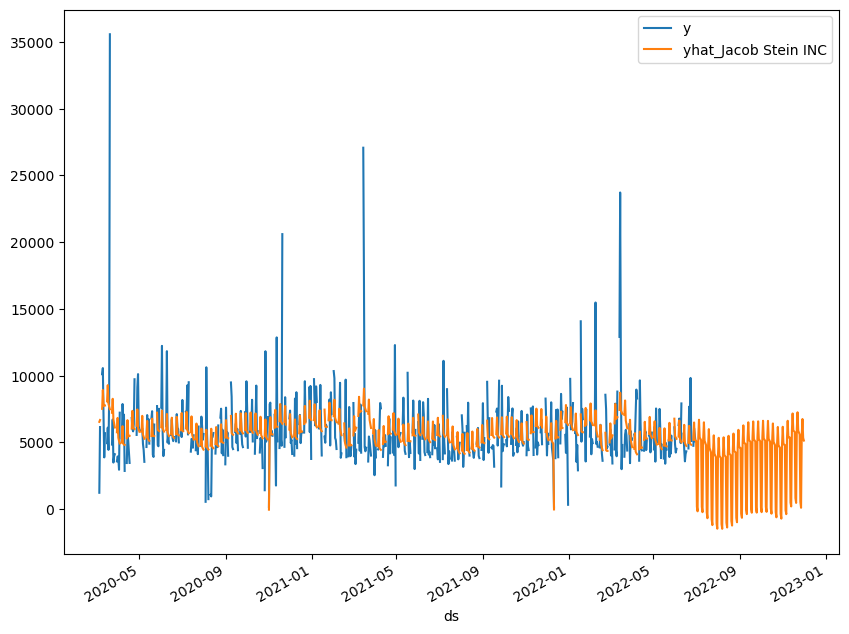

In [23]:
#visualizing selected clients
pd.concat([data_final.set_index('ds').query('anonimized_name=="Jacob Stein INC"')['y'],target['yhat_Jacob Stein INC']],axis=1).plot()

<AxesSubplot:xlabel='ds'>

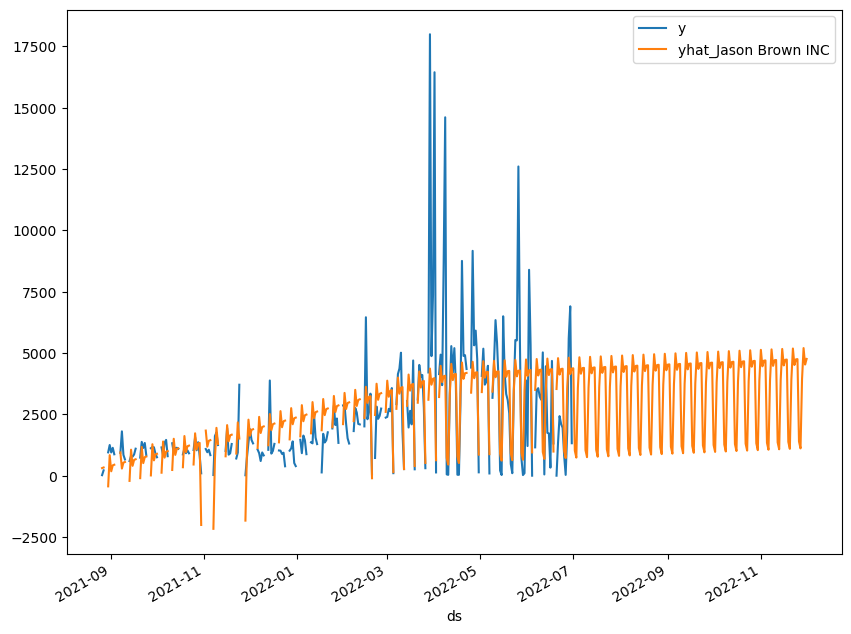

In [24]:
pd.concat([data_final.set_index('ds').query('anonimized_name=="Jason Brown INC"')['y'],target['yhat_Jason Brown INC']],axis=1).plot()

In [25]:
target = target.reset_index()

In [26]:
target['ds'] = pd.to_datetime(target['ds'])

In [27]:
target.set_index('ds', inplace=True)

In [28]:
pd.set_option('display.max_columns', None)
target1 = target.loc['2022-07-01':]

In [29]:
target1 = target1.resample('M').mean()

In [ ]:
#exporting data
#target1.to_csv('Desktop/pitney_bowes_test_data.csv')